# ERN/Pe ERP wave analyses visualization

### Imports

In [1]:
import os
import re
import glob
import os
import ast
import os.path as op
from collections import defaultdict
from copy import deepcopy
import copy

import pickle
from time import time
import pywt
import mne
import scipy
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import cesium.featurize
from plotly.subplots import make_subplots
from ipywidgets import Dropdown, FloatRangeSlider, IntSlider, FloatSlider, interact
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.base import TransformerMixin, BaseEstimator

import sys

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.svm import SVR
from sklearn.decomposition import FastICA
from sklearn.decomposition import PCA

import seaborn as sns
import matplotlib.pyplot as plt
from rumination_experiment_transformers_averaged_CDS import *
from sklearn.model_selection import KFold

from matplotlib.markers import MarkerStyle
from matplotlib.transforms import Affine2D

import warnings

warnings.filterwarnings("ignore")


In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### Read data

In [3]:
results_ern = pd.read_pickle("../public_data/results/models_pickles/ern_waves_analysis_train_cv_lin.pkl")
results_pe = pd.read_pickle("../public_data/results/models_pickles/pe_waves_analysis_train_cv_lin.pkl")

#### 1. Extract data pre-processing pipeliens for ERN and Pe

In [4]:
ern_pipeline = results_ern.pre_processed_pipeline[0]
ern_features_pipeline = results_ern.best_estimator[0][:-1]

pe_pipeline = results_pe.pre_processed_pipeline[0]
pe_features_pipeline = results_pe.best_estimator[0][:-1]

#### 2. Read the data

The train data

In [5]:
df_name = "go_nogo_100_600_df_3-5_all_scales"
pickled_data_filename = "../data/responses_100_600_pickled/" + df_name + ".pkl"
info_filename = "../data/scales/all_scales.csv"

if os.path.isfile(pickled_data_filename):
    print("Pickled file found. Loading pickled data...")
    epochs_df = pd.read_pickle(pickled_data_filename)
    print("Done")
    pass
else:
    print("Pickled file not found")

Pickled file found. Loading pickled data...
Done


In [6]:
X_train_df = epochs_df

In [7]:
X_train_df = X_train_df.fillna(X_train_df.mean())
X_train_df.isnull().sum()

id                                                                                                               0
epoch                                                                                                            0
marker                                                                                                           0
Demo_kod                                                                                                         1
Pula badań                                                                                                       0
Płeć                                                                                                             0
Ręczność                                                                                                         0
Wiek                                                                                                             0
Dotychczasowa liczba lat edukacji                                               

The test data

In [8]:
df_name = 'go_nogo_100_600_test_df_3-5_all_scales'
pickled_data_filename = "../data/responses_100_600_pickled/" + df_name + ".pkl"
info_filename = "../data/scales/all_scales.csv"

if os.path.isfile(pickled_data_filename):
    print("Pickled file found. Loading pickled data...")
    epochs_df = pd.read_pickle(pickled_data_filename)
    print("Done")
    pass
else:
    print("Pickled file not found")

Pickled file found. Loading pickled data...
Done


In [9]:
X_test_df = epochs_df

In [10]:
X_test_df = X_test_df.fillna(X_test_df.mean())
X_test_df.isnull().sum()

id                                                                                                               0
epoch                                                                                                            0
marker                                                                                                           0
Demo_kod                                                                                                         0
Pula badań                                                                                                       0
Płeć                                                                                                             0
Ręczność                                                                                                         0
Wiek                                                                                                             0
Dotychczasowa liczba lat edukacji                                               

#### Select questionnaires

In [11]:
# shape 1-D: scores
rumination = "16-Rumination Full Scale"
dass_anxiety = "05-DASS-21 Anxiety scale"
stai_t = "04-STAI Trait SUM" 
bis = "07-BIS"
bas_dzialanie = "07-BAS Dzialanie"
bas_przyjemnosc = "07-BAS Poszukiwanie przyjemnosci"
bas_nagroda = "07-BAS Wrazliwosc na nagrode"
washing = "14-Obsessive-Compulsive WASHING"
obsessing = "14-Obsessive-Compulsive OBSESSING"
hoarding = "14-Obsessive-Compulsive HOARDING"
ordering = "14-Obsessive-Compulsive ORDERING"
checking = "14-Obsessive-Compulsive CHECKING"
neutralizing = "14-Obsessive-Compulsive NEUTRALIZING"
oci_r_full = "14-Obsessive-Compulsive FULL"
threat = "15-Obsessional Beliefs - Overestimation of threat"
perfectionism_IU = "15-Obsessional Beliefs - Perfectionism/ Intolerance of uncertainty"
thought_suppression = "18-Thought Suppression Inventory"
nonforgivness = "22-Nonforgiveness - Full Scale"
indecisivness = "27-Indecisiveness Scale_Frost"
IU_prospecitve = "28-Intolerance of Uncertainty - Prospective Anxiety"
IU_inhibitory = "28-Intolerance of Uncertainty - Inhibitory Anxiety"
self_esteem = "06-Self-Esteem Scale_SES Rosenberga"

In [12]:
scales = [
    rumination,
    dass_anxiety,
    stai_t,
    bis,
    washing,
    obsessing,
    hoarding,
    ordering,
    checking,
    neutralizing,
    oci_r_full,
    threat,
    thought_suppression,
    IU_prospecitve,
    IU_inhibitory,
    self_esteem,
]

In [13]:
# dictionary for renaming scales names
scales_dict = {
    "16-Rumination Full Scale": "RRQ",
    "05-DASS-21 Anxiety scale": "DASS-21 Anx",
    "04-STAI Trait SUM": "STAI-T",
    "07-BIS": "BIS",
    "14-Obsessive-Compulsive WASHING": "Washing",
    "14-Obsessive-Compulsive OBSESSING": "Obsessing",
    "14-Obsessive-Compulsive HOARDING": "Hoarding",
    "14-Obsessive-Compulsive ORDERING": "Ordering",
    "14-Obsessive-Compulsive CHECKING": "Checking",
    "14-Obsessive-Compulsive NEUTRALIZING": "Neutralizing",
    "14-Obsessive-Compulsive FULL": "OCI-R",
    "15-Obsessional Beliefs - Overestimation of threat": "OT",
    "18-Thought Suppression Inventory": "WBSI",
    "28-Intolerance of Uncertainty - Prospective Anxiety": "IUS-P",
    "28-Intolerance of Uncertainty - Inhibitory Anxiety": "IUS-I",
    "06-Self-Esteem Scale_SES Rosenberga": "SES",
              }

Normalize STAI score

In [14]:
X_train_df["04-STAI Trait SUM" ] = X_train_df["04-STAI Trait SUM" ] / 20
X_test_df["04-STAI Trait SUM" ] = X_test_df["04-STAI Trait SUM" ] / 20

#### 3. Apply piplines to data to extract features and add questionnaries info

Train dataset

In [ ]:
erp_scores_per_paricipant_train_df = pd.DataFrame()

dataset_name = "train"
dataset = X_train_df

for scale in scales:
    this_df = pd.DataFrame()

    scale_score = np.array(X_train_df[scale].to_list())
    
    # ERN
    X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

    X_ern_mid = ern_pipeline.transform(X_df_copy)
    X_ern = ern_features_pipeline.transform(X_ern_mid)

    # Pe
    X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

    X_pe_mid = pe_pipeline.transform(X_df_copy)
    X_pe = pe_features_pipeline.transform(X_pe_mid)

    this_df["ERN"] = X_ern.flatten() * 1000000
    this_df["Pe"] = X_pe.flatten() * 1000000
    this_df["dataset"] = [dataset_name] * len(X_ern.flatten())
    this_df["scale"] = [scales_dict[scale]] * len(X_ern.flatten())
    this_df["scale_score"] = scale_score
    
    erp_scores_per_paricipant_train_df = erp_scores_per_paricipant_train_df.append(this_df, ignore_index=True)

Test dataset

In [ ]:
erp_scores_per_paricipant_test_df = pd.DataFrame()

dataset_name = "test"
dataset = X_test_df

for scale in scales:
    this_df = pd.DataFrame()

    scale_score = np.array(X_test_df[scale].to_list())
    
    # ERN
    X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

    X_ern_mid = ern_pipeline.transform(X_df_copy)
    X_ern = ern_features_pipeline.transform(X_ern_mid)

    # Pe
    X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

    X_pe_mid = pe_pipeline.transform(X_df_copy)
    X_pe = pe_features_pipeline.transform(X_pe_mid)

    this_df["ERN_test"] = (X_ern.flatten() * 1000000).tolist() + ([np.nan] * (len(X_train_df) - len(X_test_df))) 
    this_df["Pe_test"] = (X_pe.flatten() * 1000000).tolist() + ([np.nan] * (len(X_train_df) - len(X_test_df)))
    this_df["dataset_test"] = [dataset_name] * len(X_ern.flatten()) + [np.nan] * (len(X_train_df) - len(X_test_df))
    this_df["scale_test"] = [scales_dict[scale]] * len(X_ern.flatten()) + [np.nan] * (len(X_train_df) - len(X_test_df))
    this_df["scale_score_test"] = scale_score.tolist() + [np.nan] * (len(X_train_df) - len(X_test_df))
    
    erp_scores_per_paricipant_test_df = erp_scores_per_paricipant_test_df.append(this_df, ignore_index=True)

In [17]:
erp_scores_per_paricipant_train_df.head()

,ERN,Pe,dataset,scale,scale_score
0,-4.188265,27.355478,train,RRQ,2.17
1,-3.915253,12.434028,train,RRQ,1.33
2,-17.944733,4.593509,train,RRQ,4.25
3,0.380962,7.138055,train,RRQ,2.67
4,-2.832309,8.190481,train,RRQ,4.58


In [18]:
erp_scores_per_paricipant_test_df.head()

,ERN_test,Pe_test,dataset_test,scale_test,scale_score_test
0,-5.423379,17.263218,test,RRQ,4.50
1,-10.162958,6.178236,test,RRQ,2.58
2,1.697429,7.728744,test,RRQ,3.83
3,-2.743387,16.434524,test,RRQ,4.00
4,-1.747550,14.274038,test,RRQ,3.00


##### 5. Plot relationships between all train data and questionnaries

ERN

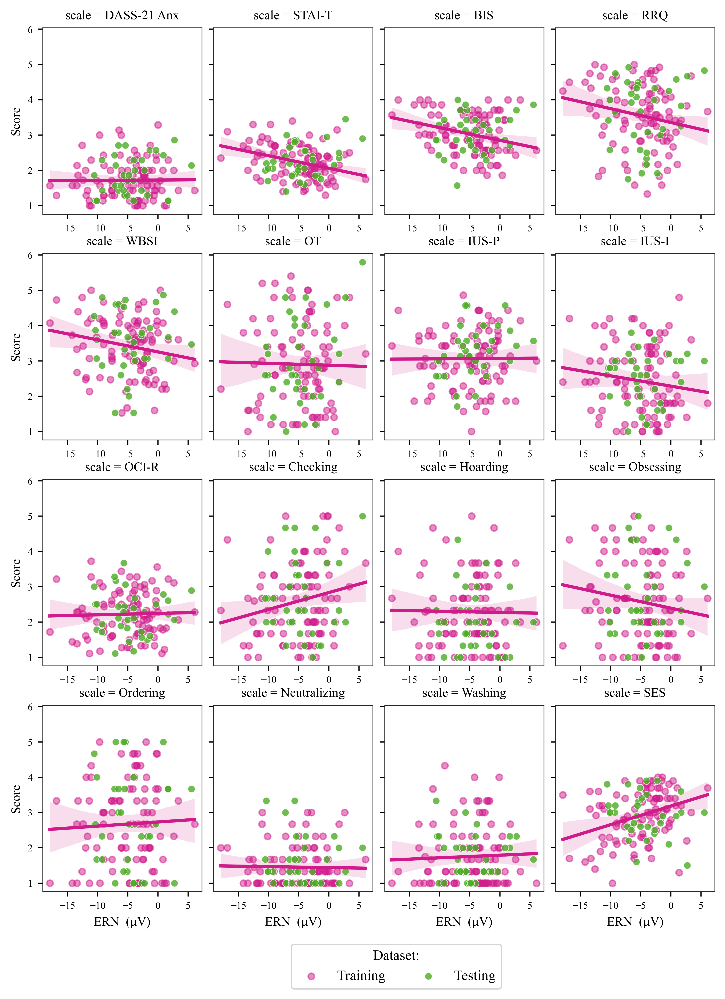

In [56]:
cm = 1/2.54
dpi = 500

plt.rcParams['figure.dpi'] = dpi
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['axes.labelsize'] = 9
plt.rcParams["axes.edgecolor"] = ".15"
plt.rcParams["axes.linewidth"]  = 0.5

custom_palette = [ '#d01c8b']
sns.set_palette(custom_palette)


g = sns.FacetGrid(
    pd.concat([erp_scores_per_paricipant_train_df, erp_scores_per_paricipant_test_df], axis=1), 
    col="scale",
    col_wrap=4,
    col_order = [
        "DASS-21 Anx", 
        "STAI-T", 
        "BIS", 
        "RRQ",  
        "WBSI", 
        "OT", 
        "IUS-P", 
        "IUS-I", 
        "OCI-R", 
        "Checking", 
        "Hoarding", 
        "Obsessing",
        "Ordering",
        "Neutralizing",
        "Washing",
        "SES"
    ],
    sharex=False,
    despine=False,
)

# relationships between scales and ERP scores on train dataset
g.map_dataframe(
    sns.regplot, 
    x="ERN", 
    y="scale_score",  
    scatter_kws = {"alpha":0.5, "s":20},
    label="Training"
)

# add test dataset points
g.map_dataframe(
    sns.scatterplot, 
    x="ERN_test", 
    y="scale_score_test",
    color="#4dac26",
    alpha=0.8,
    s=25,
    label="Testing"
)

# set  x-ticks
g.set(xticks=np.array([-15, -10, -5, 0, 5]))
g.set_axis_labels("ERN  (μV)", "Score")

# add legend
g.add_legend()
sns.move_legend(
    g, "lower center",
    bbox_to_anchor=(.5, -0.07), ncol=2, title="Dataset:", frameon=True,
)

# set size of canvas
fig = g.fig
fig.set_size_inches(19*cm, 23*cm)

# plt.show()
fig.savefig(f'../public_data/figures/erp_analyses/ern_dpi_{dpi}', bbox_inches='tight')

Pe

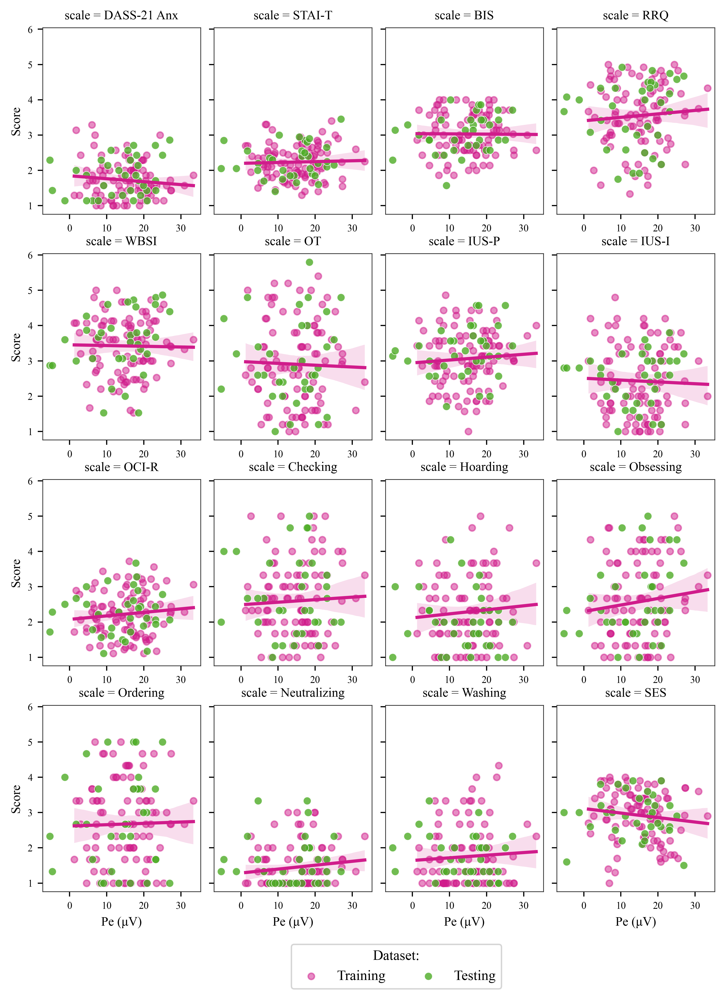

In [58]:
cm = 1/2.54
dpi = 500

plt.rcParams['figure.dpi'] = dpi
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['axes.labelsize'] = 9
plt.rcParams["axes.edgecolor"] = ".15"
plt.rcParams["axes.linewidth"]  = 0.5

custom_palette = [ '#d01c8b']
sns.set_palette(custom_palette)


g = sns.FacetGrid(
    pd.concat([erp_scores_per_paricipant_train_df, erp_scores_per_paricipant_test_df], axis=1), 
    col="scale",
    col_wrap=4,
    col_order = [
        "DASS-21 Anx", 
        "STAI-T", 
        "BIS", 
        "RRQ",  
        "WBSI", 
        "OT", 
        "IUS-P", 
        "IUS-I", 
        "OCI-R", 
        "Checking", 
        "Hoarding", 
        "Obsessing",
        "Ordering",
        "Neutralizing",
        "Washing",
        "SES"
    ],
    sharex=False,
    despine=False,
)

# relationships between scales and ERP scores on train dataset
g.map_dataframe(
    sns.regplot, 
    x="Pe", 
    y="scale_score",
    scatter_kws = {"alpha":0.5, "s":20},
    label="Training"

)

# add test dataset points
g.map_dataframe(
    sns.scatterplot, 
    x="Pe_test", 
    y="scale_score_test",
    color="#4dac26",
    alpha=0.8,
    s=30,
    label="Testing"
)

g.set_axis_labels("Pe (μV)", "Score")

# add legend
g.add_legend()
sns.move_legend(
    g, "lower center",
    bbox_to_anchor=(.5, -0.07), ncol=2, title="Dataset:", frameon=True,
)

fig = g.fig
fig.set_size_inches(19*cm, 23*cm)

# plt.show()
fig.savefig(f'../public_data/figures/erp_analyses/pe_dpi_{dpi}', bbox_inches='tight')

#### 6. Splits

In [22]:
cv_kf = KFold(n_splits=3)

In [23]:
for i, (train_index, test_index) in enumerate(cv_kf.split(X_train_df)):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

Fold 0:
  Train: index=[32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55
 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79
 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95]
  Test:  index=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]
Fold 1:
  Train: index=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79
 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95]
  Test:  index=[32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55
 56 57 58 59 60 61 62 63]
Fold 2:
  Train: index=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
  Test:  index=[64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87
 88 89 90 91 92 93 94 95]


Train dataset

In [ ]:
erp_scores_per_paricipant_train_folds_df = pd.DataFrame()

dataset_name = "train"
dataset = X_train_df

for scale in scales:
    for i, (train_index, test_index) in enumerate(cv_kf.split(X_train_df)):

        this_df = pd.DataFrame()

        this_scale_score = np.array(X_train_df[scale].to_list())[train_index]

        # ERN
        X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

        X_ern_mid = ern_pipeline.transform(X_df_copy)
        X_ern = ern_features_pipeline.transform(X_ern_mid)
        
        this_split_X_ern = X_ern.flatten()[train_index]

        # Pe
        X_df_copy = pd.DataFrame(copy.deepcopy(dataset.to_dict()))

        X_pe_mid = pe_pipeline.transform(X_df_copy)
        X_pe = pe_features_pipeline.transform(X_pe_mid)
        
        this_split_X_pe = X_pe.flatten()[train_index]


        this_df["ERN"] = this_split_X_ern * 1000000
        this_df["Pe"] = this_split_X_pe * 1000000
        this_df["dataset"] = [dataset_name] * len(this_split_X_ern)
        this_df["scale"] = [scales_dict[scale]] * len(this_split_X_ern)
        this_df["fold"] = [i+1] * len(this_split_X_ern)
        this_df["scale_score"] = this_scale_score

        erp_scores_per_paricipant_train_folds_df = erp_scores_per_paricipant_train_folds_df.append(this_df, ignore_index=True)

ERN

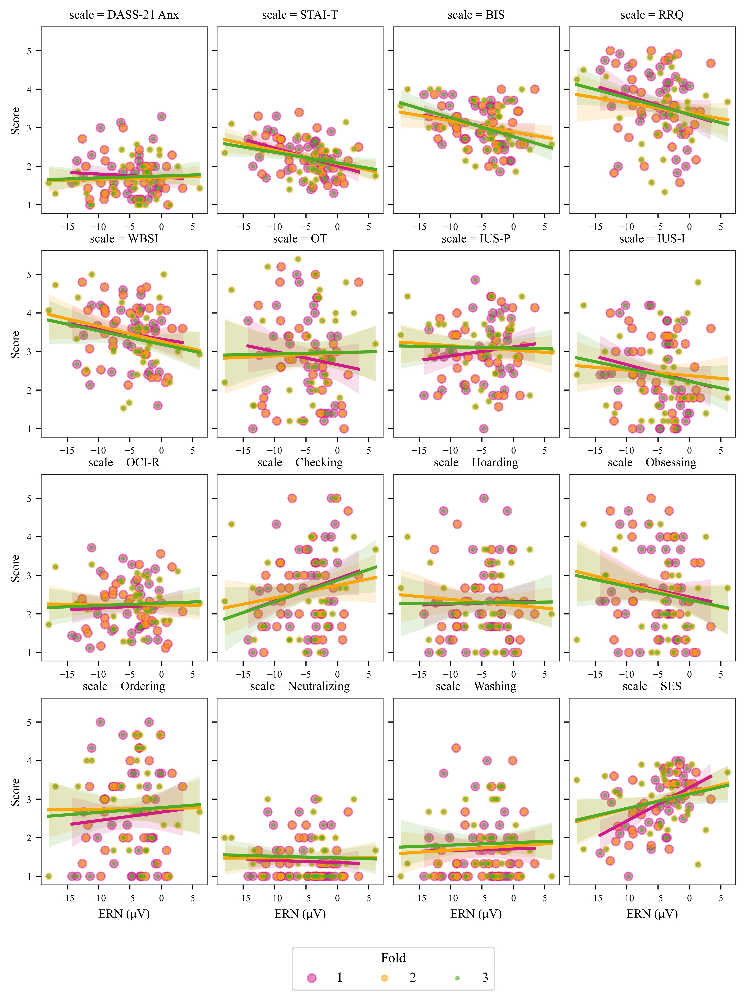

In [59]:
cm = 1/2.54
dpi = 500

plt.rcParams['figure.dpi'] = dpi
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['axes.labelsize'] = 9
plt.rcParams["axes.edgecolor"] = ".15"
plt.rcParams["axes.linewidth"]  = 0.5

custom_palette = [ '#d01c8b', "orange", "#4dac26",]
sns.set_palette(custom_palette)


g = sns.lmplot(
    data=erp_scores_per_paricipant_train_folds_df,
    x="ERN",
    y="scale_score",
    hue="fold",
    col="scale",
    col_wrap=4,
    # reg_fit = True,
    col_order = [
        "DASS-21 Anx", 
        "STAI-T", 
        "BIS", 
        "RRQ",  
        "WBSI", 
        "OT", 
        "IUS-P", 
        "IUS-I", 
        "OCI-R", 
        "Checking", 
        "Hoarding", 
        "Obsessing",
        "Ordering",
        "Neutralizing",
        "Washing",
        "SES"
    ],
    legend = True,
    legend_out=True,
    facet_kws=dict(sharex=False, sharey=True, despine=False),
    scatter_kws = {"alpha":0.5},
    # scatter_kws = {"alpha":0.7, "edgecolors":"black", "linewidths":0.3},
    markers= [
        MarkerStyle("o", transform=Affine2D().scale(1)),MarkerStyle("o", transform=Affine2D().scale(0.7)), MarkerStyle("o", transform=Affine2D().scale(0.4))],
)
g.set(xticks=np.array([-15, -10, -5, 0, 5]))
g.set_axis_labels("ERN (μV)", "Score")

g.figure.subplots_adjust(wspace=.06, hspace=.2)

sns.move_legend(
    g, "lower center",
    bbox_to_anchor=(.5, -0.1), ncol=3, title="Fold", frameon=True,
)

fig = g.fig
fig.set_size_inches(19*cm, 23*cm)

# plt.show()
fig.savefig(f'../public_data/figures/erp_analyses/ern_folds_dpi_{dpi}', bbox_inches='tight')

Pe

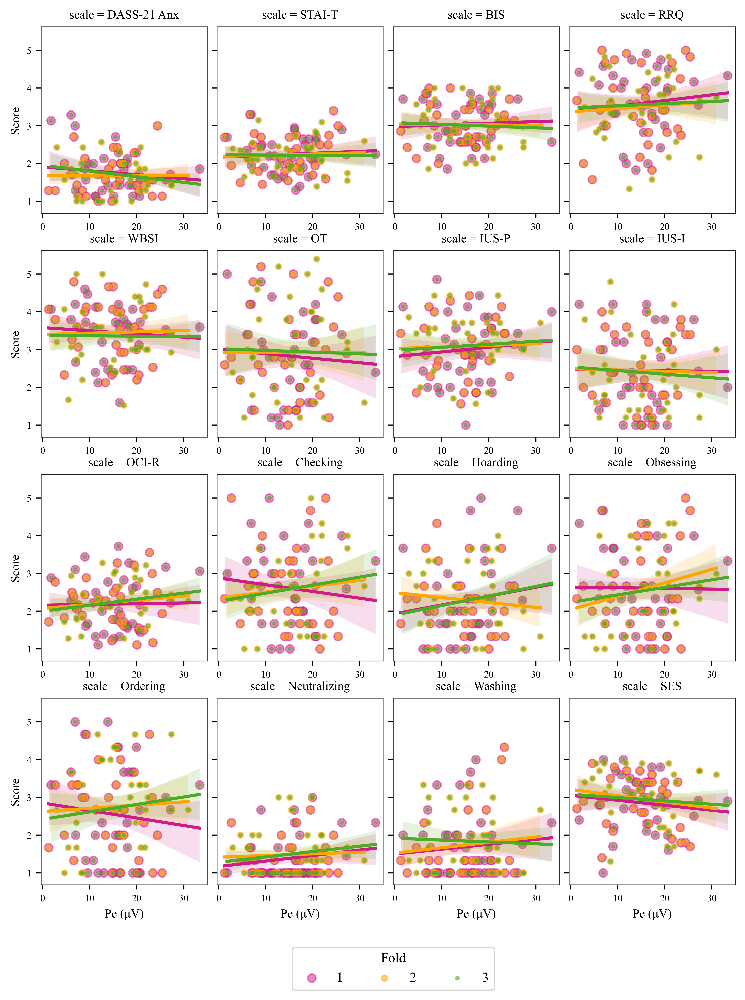

In [60]:
cm = 1/2.54
dpi = 500

plt.rcParams['figure.dpi'] = dpi
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['ytick.labelsize'] = 7
plt.rcParams['xtick.labelsize'] = 7
plt.rcParams['axes.labelsize'] = 9
plt.rcParams["axes.edgecolor"] = ".15"
plt.rcParams["axes.linewidth"]  = 0.5

custom_palette = [ '#d01c8b', "orange", "#4dac26",]
sns.set_palette(custom_palette)


g = sns.lmplot(
    data=erp_scores_per_paricipant_train_folds_df,
    x="Pe",
    y="scale_score",
    hue="fold",
    col="scale",
    col_wrap=4,
    # reg_fit = True,
    col_order = [
        "DASS-21 Anx", 
        "STAI-T", 
        "BIS", 
        "RRQ",  
        "WBSI", 
        "OT", 
        "IUS-P", 
        "IUS-I", 
        "OCI-R", 
        "Checking", 
        "Hoarding", 
        "Obsessing",
        "Ordering",
        "Neutralizing",
        "Washing",
        "SES"
    ],
    legend = True,
    legend_out=True,
    facet_kws=dict(sharex=False, sharey=True, despine=False),
    scatter_kws = {"alpha":0.5},
    # scatter_kws = {"alpha":0.7, "edgecolors":"black", "linewidths":0.3},
    markers= [
        MarkerStyle("o", transform=Affine2D().scale(1)),MarkerStyle("o", transform=Affine2D().scale(0.7)), MarkerStyle("o", transform=Affine2D().scale(0.4))],
)
g.set_axis_labels("Pe (μV)", "Score")

g.figure.subplots_adjust(wspace=.06, hspace=.2)

sns.move_legend(
    g, "lower center",
    bbox_to_anchor=(.5, -0.1), ncol=3, title="Fold", frameon=True,
)

fig = g.fig
fig.set_size_inches(19*cm, 23*cm)

# plt.show()
fig.savefig(f'../public_data/figures/erp_analyses/pe_folds_dpi_{dpi}', bbox_inches='tight')